## <center>4741</center> 
### <center>Home work 1 (Question 1) </center> 
#### <center>Submitted by </center> 
##### <center> Aman jain (aj644), Vineel Yellapantula (vy45) </center> 

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# we are using one of the kaggle dataset. 

### data set contains location data of shared car service tel. 

AutoTel is Tel Aviv's shared cars service, similar idea to Bird and Lime. Users can book a car and pay for it by the minute. 

In [61]:
df = pd.read_csv('/Users/ankitajain/Downloads/4741-big_messy/auto_tel_location.csv')

In [62]:
df.head(100)  # looking at the top data 

,timestamp,latitude,longitude,total_cars,carsList
0,2019-01-10 11:45:55.070781 UTC,32.099950,34.787940,1,[182]
1,2019-01-10 11:45:55.070781 UTC,32.065670,34.796120,1,[268]
2,2019-01-10 11:45:55.070781 UTC,32.064650,34.803220,1,[106]
3,2019-01-10 11:45:55.070781 UTC,32.059780,34.810340,1,[180]
4,2019-01-10 11:45:55.070781 UTC,32.051330,34.750890,1,[16]
5,2019-01-10 11:45:55.070781 UTC,32.042230,34.774200,1,[72]
6,2019-01-10 11:45:55.070781 UTC,32.041560,34.771280,1,[160]
7,2019-01-10 11:45:55.070781 UTC,32.123730,34.813460,1,[210]
8,2019-01-10 11:45:55.070781 UTC,32.118740,34.834060,1,[136]
9,2019-01-10 11:45:55.070781 UTC,32.033510,34.755090,1,[27]


Analysing head data visually we can interpret that:
    1. timestamp is in long date format. We will need to further clean it up to understand its distribution. 
    2. latitude and longitude as expected are floats and looks to be in clean format. 
    3. total_cars is number of available cars at given lat long and timestamp. 
    4. carslist is set of cars available at geospatial location. 

In [63]:
df.describe() # looking at the top data 

,latitude,longitude,total_cars
count,6.683756e+06,6.683756e+06,6.683756e+06
mean,3.208337e+01,3.478899e+01,6.432292e-01
std,2.639419e-02,2.200057e-02,6.984731e-01
min,3.195223e+01,3.472998e+01,0.000000e+00
25%,3.206119e+01,3.477352e+01,0.000000e+00
50%,3.208144e+01,3.478642e+01,1.000000e+00
75%,3.210724e+01,3.479933e+01,1.000000e+00
max,3.214566e+01,3.495142e+01,1.000000e+01


From above table we understand that: 
    1. There are about 6.6 million rows in our dataset. 
    2. Area covered by data can be considered as rectangle given by diagonal co-ordinates as {(31.95223,34.72998),  (32.14566,34.95142)} - this again is quite small and contained. 
    3. Max total_cars available varies from 0 to 100. 

Answer 1 b). Given this dataset, We want to know if there is an opportunity of optimization across time or geography. This means if there are times or geographies which have mismatch in terms of demand. 

Motivation, behind this is to understand if there is an opportunities to improve car availability in busy areas (either via having a fleet of drivers or nudging customers to drop cars at busy location or via pricing strategy). 

As we look at the data description, there are no direct indicators of demand available in the dataset. So we will be using total_cars as proxy for this. Please note that this proxy is not 100% accurate as there will be 
    

Answer 1 c). Four visualizations: 
i). Heat map of all locaitons to understand geographical spread.
ii). Hour of day demand. 
iii). Day of week demand. 
iv). Are there locations which do not have cars available for most of the time (say more than 80% of times)?
 

In [64]:
import folium
from folium import plugins
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [65]:
# Drawing a map with average lat longs as learnt from data description abvoe. 

m = folium.Map([32.08337, 34.78899], zoom_start=11)
m

In [146]:
# creating a sub set of data (taking 500,000 points for EDA here) from main data set for quick iterations. 
df1 = df.head(500000) 
df1.head(100)

,timestamp,latitude,longitude,total_cars,carsList
0,2019-01-10 11:45:55.070781 UTC,32.099950,34.787940,1,[182]
1,2019-01-10 11:45:55.070781 UTC,32.065670,34.796120,1,[268]
2,2019-01-10 11:45:55.070781 UTC,32.064650,34.803220,1,[106]
3,2019-01-10 11:45:55.070781 UTC,32.059780,34.810340,1,[180]
4,2019-01-10 11:45:55.070781 UTC,32.051330,34.750890,1,[16]
5,2019-01-10 11:45:55.070781 UTC,32.042230,34.774200,1,[72]
6,2019-01-10 11:45:55.070781 UTC,32.041560,34.771280,1,[160]
7,2019-01-10 11:45:55.070781 UTC,32.123730,34.813460,1,[210]
8,2019-01-10 11:45:55.070781 UTC,32.118740,34.834060,1,[136]
9,2019-01-10 11:45:55.070781 UTC,32.033510,34.755090,1,[27]


In [21]:
# mark each station as a point
#for index, row in df1.iterrows():
#    folium.CircleMarker([row['latitude'], row['longitude']],
#                        radius=3,
#                        fill_color="#3db7e4", # divvy color
#                       ).add_to(m)

In [147]:
from folium import plugins
from folium.plugins import HeatMap

In [148]:
# using first 500,000 data points to draw heat map. 
heat_df = df1

# List comprehension to make out list of lists
heat_data = [[row['latitude'],row['longitude']] for index, row in heat_df.iterrows()]

# Plot it on the map
HeatMap(heat_data).add_to(m)

# Display the map
m

# Learning from image 1

From above heat map we understand that given data set captures data across the center of city with each lat long being uniformly distributed. Data at city boundaries grows thin, which is understandable. Also, there are few outliers out of the city. At this point, another question arises if company policy allows users to take vehicle out of the city or not - depending on answer, we can bifurcate this analysis in two parts - out of city rides and within city rides. 

In [149]:
# Next we need to aggreegate lat longs into blocks. Geohashs are a good way of doing that.  
# Width of the block can be controlled by precision degree, which we are taking 6 for now. 
# importing geohash library

import pygeohash as gh 
geohash=df1.apply(lambda x: gh.encode(x.latitude, x.longitude, precision=6), axis=1)
geohash.head(5)
df1['geohash'] = geohash
df1.head(5)

/Users/ankitajain/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,timestamp,latitude,longitude,total_cars,carsList,geohash
0,2019-01-10 11:45:55.070781 UTC,32.09995,34.78794,1,[182],sv8wxe
1,2019-01-10 11:45:55.070781 UTC,32.06567,34.79612,1,[268],sv8wrv
2,2019-01-10 11:45:55.070781 UTC,32.06465,34.80322,1,[106],sv8wrv
3,2019-01-10 11:45:55.070781 UTC,32.05978,34.81034,1,[180],sv8y2h
4,2019-01-10 11:45:55.070781 UTC,32.05133,34.75089,1,[16],sv8wqf


In [150]:
df1['hour'] = df1['timestamp'].str[11:13]
df1['date'] = df1['timestamp'].str[8:10]
df1['month'] = df1['timestamp'].str[5:7]
df1.head(5)

/Users/ankitajain/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/ankitajain/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/ankitajain/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

,timestamp,latitude,longitude,total_cars,carsList,geohash,hour,date,month
0,2019-01-10 11:45:55.070781 UTC,32.09995,34.78794,1,[182],sv8wxe,11,10,01
1,2019-01-10 11:45:55.070781 UTC,32.06567,34.79612,1,[268],sv8wrv,11,10,01
2,2019-01-10 11:45:55.070781 UTC,32.06465,34.80322,1,[106],sv8wrv,11,10,01
3,2019-01-10 11:45:55.070781 UTC,32.05978,34.81034,1,[180],sv8y2h,11,10,01
4,2019-01-10 11:45:55.070781 UTC,32.05133,34.75089,1,[16],sv8wqf,11,10,01


Text(0.5, 1.0, 'Distribution of available cars across the dates')

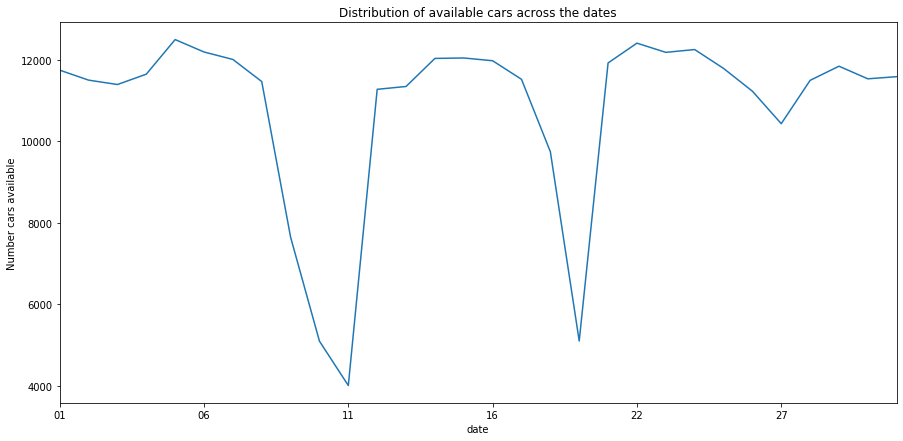

In [151]:
fig, ax = plt.subplots(figsize=(15,7))
df1.groupby(['date']).sum()['total_cars'].plot(ax=ax)
ax.set_xlabel('date')
ax.set_ylabel('Number cars available')
ax.set_title('Distribution of available cars across the dates')

# Learning from image 2

We can see from distribution above Fridays (11th january and 18th january) seems to be days where available cars are minimum and hence peak of demand comes on this day. Also we can see somewhat weekly pattern in demand here. 

Text(0.5, 1.0, 'Distribution of available cars across the hour')

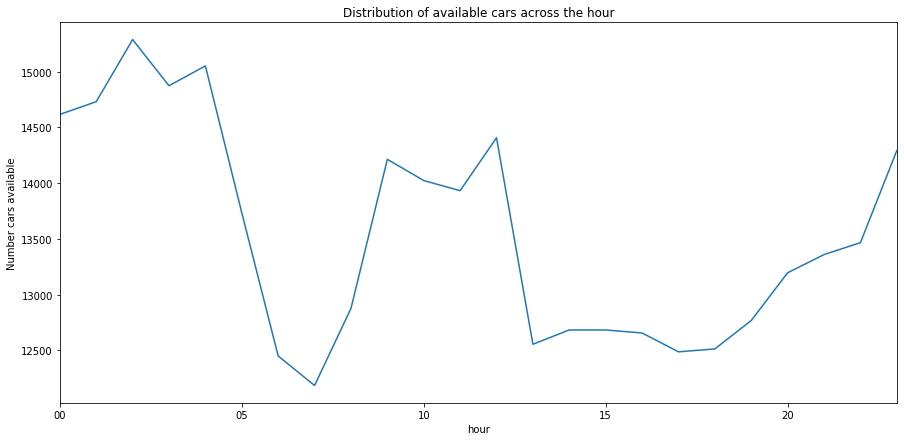

In [152]:
fig, ax = plt.subplots(figsize=(15,7))
df1.groupby(['hour']).sum()['total_cars'].plot(ax=ax)
ax.set_xlabel('hour')
ax.set_ylabel('Number cars available')
ax.set_title('Distribution of available cars across the hour')

# Learning from image 3

We can see from graph above, number of cars available dips in morning and evening commute hours. In morning, 6 AM to 8 AM and in evening 3 PM to 7 PM seems to be peak hours in terms of demand of these cars. 

In [153]:
df1_zero = df1[df1['total_cars'] == 0]
df1_zero_grouped = df1_zero.groupby(['geohash']).count()['total_cars']

df1_non_zero = df1[df1['total_cars'] > 0]
df1_non_zero_grouped = df1_non_zero.groupby(['geohash']).count()['total_cars']


In [154]:
df1_zero_grouped.head(5)

geohash
sv8wnz     304
sv8wqb    1579
sv8wqc    1566
sv8wqf    5867
sv8wqg    4785
Name: total_cars, dtype: int64

In [155]:
df1_non_zero_grouped.head(5)

geohash
sv8tz0       3
sv8wng      14
sv8wnw     731
sv8wnx    2146
sv8wny       1
Name: total_cars, dtype: int64

In [156]:
df1_geohash_merged = df1_zero_grouped.to_frame().merge(df1_non_zero_grouped.to_frame(), left_on='geohash', right_on='geohash')

In [157]:
#df1_geohash_merged.head(5)
df1_geohash_merged.rename(columns={"total_cars_x": "instances with 0 cars","total_cars_y": "instances with >0 cars" })
df1_geohash_merged.head(5)

,total_cars_x,total_cars_y
geohash,,
sv8wnz,304,2260
sv8wqb,1579,4340
sv8wqc,1566,4848
sv8wqf,5867,6759
sv8wqg,4785,5121


In [158]:
df1_geohash_merged['zero cars %'] = df1_geohash_merged['total_cars_x'] / (df1_geohash_merged['total_cars_x'] + df1_geohash_merged['total_cars_y'])
df1_geohash_merged.head(5)

,total_cars_x,total_cars_y,zero cars %
geohash,,,
sv8wnz,304,2260,0.118565
sv8wqb,1579,4340,0.266768
sv8wqc,1566,4848,0.244153
sv8wqf,5867,6759,0.464676
sv8wqg,4785,5121,0.483041


Text(0, 0.5, '# of geohashes')

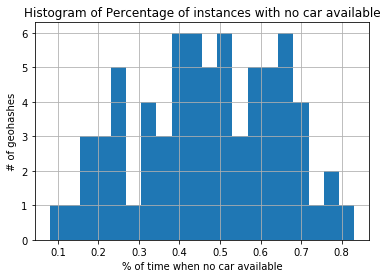

In [159]:
import pylab as pl
df1_geohash_merged['zero cars %'].hist(bins = 20)
pl.title("Histogram of Percentage of instances with no car available")
pl.xlabel("% of time when no car available")
pl.ylabel("# of geohashes")

# Learning from image 4
We can see there are few geohashes which have more than 70% of times (right of the histogram above) no car being available. These are the locations where either demand is typically high and/or theses locations do not see people parking cars. There seems to be some optimizaiton scope if we can move some cars to these locations. 